# PGA-UNet vs Attention U-Net - Test & Comparison (IMG_SIZE=512)

| Section | Content |
|---|---|
| **Setup** | Clone two separate repos, then download the dataset and checkpoints |
| **Part 1** | PGA-UNet: test 2 prompt modes + visualization |
| **Part 2** | Attention U-Net: test + visualization |
| **Summary** | Comparison table for six metrics plus bar charts |

Run in order: **Setup → Part 1 → Part 2 → Summary**

In [1]:
# ══════════════════════════════════════════════════════
# CELL 1 - SETUP (PGA-UNet + Attention U-Net)
# ══════════════════════════════════════════════════════
import os, sys, gdown, torch

BASE = '/kaggle/working' if os.path.exists('/kaggle/working') else '/content'
os.chdir(BASE)

print("CUDA:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

REPO = 'https://github.com/ThongLuc2k3/PGA_Unet2D.git'

# ── Repo: PGA_Unet2D (single clone; models/networks/attention_unet_2D.py now lives
# alongside PGA's prompt_unet_2D.py, no separate Attention U-Net repo needed) ──────
if not os.path.exists(f'{BASE}/PGA_Unet2D'):
    os.system(f'git clone -q {REPO} {BASE}/PGA_Unet2D')
print('  ✅ PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation')

# ── Dataset ───────────────────────────────────────────────────────────
DS_ZIP = f'{BASE}/dataset_BTXRD.zip'
if not os.path.exists(DS_ZIP):
    gdown.download('https://drive.google.com/uc?id=1Ep3w8GujpCQ5Qb6nlXKxXhsCxlc3k8gx',
                   DS_ZIP, quiet=False)
for repo in ['PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation', 'PGA_Unet2D']:
    if not os.path.exists(f'{BASE}/{repo}/dataset_BTXRD'):
        os.system(f'unzip -oq {DS_ZIP} -d {BASE}/{repo}/')
print('  ✅ Dataset ready for both repos')

# ── Checkpoints ───────────────────────────────────────────────────────
for repo, fn, drv_id in [
    ('PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation',  'pga_unet_zoom_out_512_best.pth', '1NhRfMAf0T52-_5EqgqfdroRiHDk4A_m3'),
    ('PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation', 'att_unet_best.pth', '1hlw7RlNgF0ChFIczSHuW4y3ygeUAmpYM'),
]:
    os.makedirs(f'{BASE}/{repo}/checkpoints', exist_ok=True)
    p = f'{BASE}/{repo}/checkpoints/{fn}'
    if not os.path.exists(p):
        gdown.download(f'https://drive.google.com/uc?id={drv_id}', p, quiet=False)
    print(f'  ✅ {fn}  {os.path.getsize(p)//1024} KB')

os.system('pip install -q tqdm opencv-python matplotlib scipy gdown')
print(f'\n✅ Setup DONE  |  device={"cuda" if torch.cuda.is_available() else "cpu"}')


CUDA: True
GPU: Tesla T4
  ✅ PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation


Downloading...
From (original): https://drive.google.com/uc?id=1Ep3w8GujpCQ5Qb6nlXKxXhsCxlc3k8gx
From (redirected): https://drive.google.com/uc?id=1Ep3w8GujpCQ5Qb6nlXKxXhsCxlc3k8gx&confirm=t&uuid=5ababd9d-68bb-498d-82e2-ea0004138316
To: /kaggle/working/dataset_BTXRD.zip
100%|██████████| 1.71G/1.71G [00:19<00:00, 87.5MB/s]


  ✅ Dataset ready for both repos


Downloading...
From: https://drive.google.com/uc?id=1NhRfMAf0T52-_5EqgqfdroRiHDk4A_m3
To: /kaggle/working/PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation/checkpoints/pga_unet_zoom_out_512_best.pth
100%|██████████| 11.9M/11.9M [00:00<00:00, 48.4MB/s]


  ✅ pga_unet_zoom_out_512_best.pth  11617 KB


Downloading...
From: https://drive.google.com/uc?id=1hlw7RlNgF0ChFIczSHuW4y3ygeUAmpYM
To: /kaggle/working/PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation/checkpoints/att_unet_best.pth
100%|██████████| 10.3M/10.3M [00:00<00:00, 56.2MB/s]


  ✅ att_unet_best.pth  10053 KB

✅ Setup DONE  |  device=cuda


---
## Part 1 - PGA-UNet (IMG_SIZE=512, 2 prompt modes)
---

In [2]:
# ══════════════════════════════════════════════════════
# PART 1 - PGA-UNet Test (IMG_SIZE=512, 2 prompt modes)
# ══════════════════════════════════════════════════════
import os, csv, sys
import numpy as np
import torch
from torch.utils.data import DataLoader
from tqdm import tqdm
from scipy.ndimage import binary_erosion, distance_transform_edt
from collections import OrderedDict

BASE     = '/kaggle/working' if os.path.exists('/kaggle/working') else '/content'
PGA_ROOT = f'{BASE}/PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation'

# ── Clear the module cache, then load PGA modules ──────────────────────────
for _k in list(sys.modules.keys()):
    if any(x in _k for x in ('dataset','models','prompt_unet')): del sys.modules[_k]
if PGA_ROOT not in sys.path: sys.path.insert(0, PGA_ROOT)
else: sys.path.remove(PGA_ROOT); sys.path.insert(0, PGA_ROOT)

import importlib as _importlib
if 'dataset' in sys.modules: del sys.modules['dataset']
_importlib.invalidate_caches()
from dataset import PromptSegmentationDataset
from models.networks.prompt_unet_2D import PGA_UNet

DEVICE   = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
IMG_SIZE = 512
IMG_DIR  = f'{PGA_ROOT}/dataset_BTXRD/test/images'
JSON_DIR = f'{PGA_ROOT}/dataset_BTXRD/test/annotations'
CKPT_PATH= f'{PGA_ROOT}/checkpoints/pga_unet_zoom_out_512_best.pth'
os.makedirs(f'{PGA_ROOT}/results', exist_ok=True)

model = PGA_UNet(in_channels=1, n_classes=1, use_encoder_prompt=True).to(DEVICE)
model.load_state_dict(torch.load(CKPT_PATH, map_location=DEVICE, weights_only=True))
model.eval()
print(f'✅ PGA-UNet loaded  [{DEVICE}]')

def calc_hd95(pred, gt):
    p, g = pred.astype(bool), gt.astype(bool)
    if not p.any() and not g.any(): return 0.0
    if not p.any() or  not g.any(): return float(IMG_SIZE)
    pe = p ^ binary_erosion(p); ge = g ^ binary_erosion(g)
    d1 = distance_transform_edt(~ge)[pe]; d2 = distance_transform_edt(~pe)[ge]
    return float(IMG_SIZE) if not len(d1) or not len(d2) else float(max(np.percentile(d1,95),np.percentile(d2,95)))

def calc_metrics_img(prob_np, gt_np):
    pm=(prob_np>0.5).astype(np.float32); gm=(gt_np>0.5).astype(np.float32); eps=1e-6
    tp=(pm*gm).sum(); fp=(pm*(1-gm)).sum(); fn=((1-pm)*gm).sum()
    hd95=calc_hd95(pm,gm)
    if gm.sum()==0 or pm.sum()==0: cbl=0.0
    else:
        ys,xs=np.where(gm>0.5); yp,xp=np.where(pm>0.5)
        d=np.sqrt((ys.max()-ys.min())**2+(xs.max()-xs.min())**2)+eps
        cbl=float(np.clip(1.-np.sqrt((xp.mean()-xs.mean())**2+(yp.mean()-ys.mean())**2)/d,0,1))
    return dict(dice=float((2*tp+eps)/(2*tp+fp+fn+eps)), iou=float((tp+eps)/(tp+fp+fn+eps)),
                precision=float((tp+eps)/(tp+fp+eps)),   recall=float((tp+eps)/(tp+fn+eps)),
                hd95=hd95, cbl=cbl)

KEYS  = ['dice','iou','precision','recall','hd95','cbl']
HDRS  = ['Dice↑','IoU↑','Prec↑','Rec↑','HD95↓','CBL↑']
MODES = ['zoom_out','shift']
all_image_records = {}
pga_csv_rows = []
pga_results  = {}   # used in the summary cell

for mode in MODES:
    ds     = PromptSegmentationDataset(IMG_DIR, JSON_DIR, img_size=IMG_SIZE, is_train=False, prompt_mode=mode)
    loader = DataLoader(ds, batch_size=1, shuffle=False, num_workers=0)
    groups = OrderedDict()
    for i, (img_t, mask_t, prompt_t) in enumerate(tqdm(loader, desc=f'[{mode}]')):
        img_name, _ = ds.all_samples[i]
        gt_np=mask_t[0,0].numpy(); prompt_np=prompt_t[0,0].numpy()
        with torch.no_grad():
            prob=torch.sigmoid(model(img_t.to(DEVICE),prompt_t.to(DEVICE)))[0,0].cpu().numpy()
        if img_name not in groups:
            groups[img_name]=dict(img=img_t[0,0].numpy(),gt_union=gt_np.copy(),
                                  prob_max=prob.copy(),prompts=[prompt_np])
        else:
            g=groups[img_name]
            np.maximum(g['gt_union'],gt_np,out=g['gt_union'])
            np.maximum(g['prob_max'],prob, out=g['prob_max'])
            g['prompts'].append(prompt_np)
    img_recs=[]
    for img_name in sorted(groups.keys()):
        g=groups[img_name]; m=calc_metrics_img(g['prob_max'],g['gt_union'])
        img_recs.append(dict(img_name=img_name,img=g['img'],gt=g['gt_union'],
                             prob=g['prob_max'],prompts=g['prompts'],
                             n_samples=len(g['prompts']),**m))
    all_image_records[mode]=img_recs
    m_avg={k:np.mean([r[k] for r in img_recs]) for k in KEYS}
    pga_results[mode]=m_avg
    n_imgs=len(img_recs); n_samp=sum(r['n_samples'] for r in img_recs)
    pga_csv_rows.append([mode]+[f'{m_avg[k]:.4f}' for k in KEYS]+[str(n_imgs),str(n_samp)])

bar='='*82
print(f'\n{bar}\n  PGA-UNet - Image-level metrics (GT union+max-merge)  IMG_SIZE={IMG_SIZE}\n{bar}')
print(f"  {'Mode':<16}"+''.join(f'{h:>8}' for h in HDRS)+f"  {'N_img':>6}  {'N_smp':>6}")
print(f"  {'-'*78}")
for row in pga_csv_rows:
    print(f"  {row[0]:<16}"+''.join(f'{row[i+1]:>8}' for i in range(len(KEYS)))+f"  {row[-2]:>6}  {row[-1]:>6}")
print(bar)

with open(f'{PGA_ROOT}/results/pga_unet2d_test_results.csv','w',newline='') as f:
    w=csv.writer(f); w.writerow(['mode']+KEYS+['N_img','N_samples']); w.writerows(pga_csv_rows)
print(f'\n✅ CSV: {PGA_ROOT}/results/pga_unet2d_test_results.csv')


✅ PGA-UNet loaded  [cuda]


[shift]: 100%|██████████| 232/232 [00:18<00:00, 12.23it/s]



  PGA-UNet - Image-level metrics (GT union+max-merge)  IMG_SIZE=512
  Mode               Dice↑    IoU↑   Prec↑    Rec↑   HD95↓    CBL↑   N_img   N_smp
  ------------------------------------------------------------------------------
  zoom_out          0.8788  0.7895  0.8588  0.9082  9.0829  0.9619     187     232
  shift             0.8496  0.7462  0.8425  0.8709 11.0030  0.9418     187     232

✅ CSV: /kaggle/working/PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation/results/pga_unet2d_test_results.csv


### PGA-UNet visualization - images with >=2 GT polygons

Balanced test stems (10): ['IMG000013.png', 'IMG000298.png', 'IMG000360.png', 'IMG000402.png', 'IMG000472.png', 'IMG000002.png', 'IMG000006.png', 'IMG000020.png', 'IMG000028.png', 'IMG000052.png']


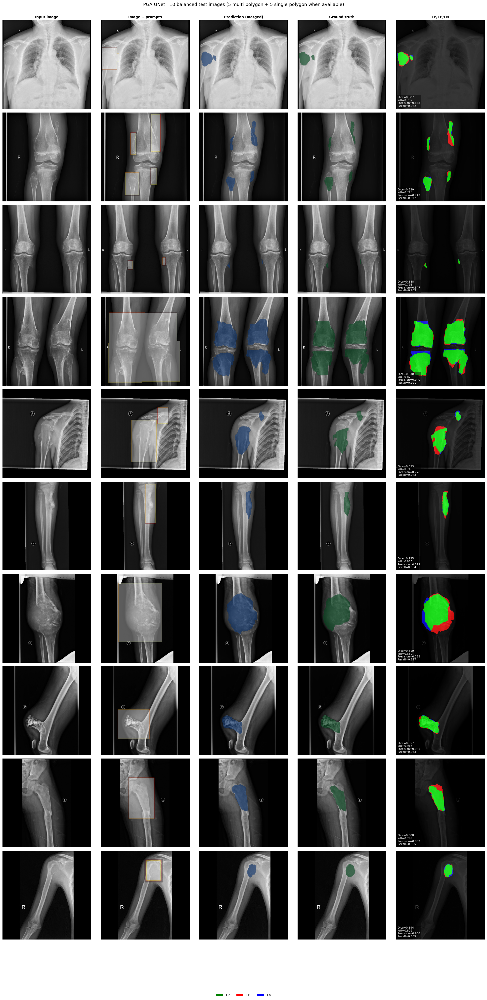

In [3]:
# Balanced qualitative test stems for 512: prefer 5 images with >=2 polygons and 5 images with 1 polygon.
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
from IPython.display import display as _ipy_display

assert 'all_image_records' in dir(), '❌ Run the PGA test cell first'
N_MULTI = 5
N_SINGLE = 5

def select_balanced_test_stems(records, n_multi=5, n_single=5):
    multi = [r['img_name'] for r in records if r['n_samples'] >= 2]
    single = [r['img_name'] for r in records if r['n_samples'] == 1]
    chosen = multi[:n_multi] + single[:n_single]
    if len(chosen) < (n_multi + n_single):
        fallback = [r['img_name'] for r in records if r['img_name'] not in chosen]
        chosen.extend(fallback[:(n_multi + n_single - len(chosen))])
    return chosen

BALANCED_TEST_STEMS_R512 = select_balanced_test_stems(all_image_records['zoom_out'], N_MULTI, N_SINGLE)
recs=[r for r in all_image_records['zoom_out'] if r['img_name'] in BALANCED_TEST_STEMS_R512]
recs=sorted(recs,key=lambda r: BALANCED_TEST_STEMS_R512.index(r['img_name']))
N_SHOW=len(recs)
print(f'Balanced test stems ({N_SHOW}): {BALANCED_TEST_STEMS_R512}')

fig,axes=plt.subplots(N_SHOW,5,figsize=(20,4*N_SHOW))
if N_SHOW==1: axes=axes[np.newaxis,:]
fig.suptitle(f'PGA-UNet - {N_SHOW} balanced test images (5 multi-polygon + 5 single-polygon when available)',fontsize=13,y=1.001)
for ax,ct in zip(axes[0],['Input image','Image + prompts','Prediction (merged)','Ground truth','TP/FP/FN']): ax.set_title(ct,fontsize=10,fontweight='bold')
for count,rec in enumerate(recs):
    img_np=rec['img']*0.5+0.5; gt_np=(rec['gt']>0.5).astype(float); pred_np=(rec['prob']>0.5).astype(float)
    pm_merged=np.max(np.stack(rec['prompts'],axis=0),axis=0)
    tp=(pred_np*gt_np).sum(); fp=(pred_np*(1-gt_np)).sum(); fn=((1-pred_np)*gt_np).sum(); e=1e-6
    dice=float((2*tp+e)/(2*tp+fp+fn+e)); iou=float((tp+e)/(tp+fp+fn+e)); pre=float((tp+e)/(tp+fp+e)); rec_=float((tp+e)/(tp+fn+e))
    row=axes[count]; bg=np.stack([img_np]*3,axis=-1)
    row[0].imshow(img_np,cmap='gray',vmin=0,vmax=1); row[0].set_ylabel(f'#{count+1} [{rec["n_samples"]}p]\nDice={dice:.3f}',fontsize=8)
    row[1].imshow(img_np,cmap='gray',vmin=0,vmax=1); row[1].imshow(np.where(pm_merged>0,pm_merged,np.nan),cmap='hot',alpha=0.35,vmin=0,vmax=1)
    row[2].imshow(bg); row[2].imshow(np.where(pred_np>0,pred_np,np.nan),cmap='Blues',alpha=0.60,vmin=0,vmax=1)
    row[3].imshow(bg); row[3].imshow(np.where(gt_np>0,gt_np,np.nan),cmap='Greens',alpha=0.60,vmin=0,vmax=1)
    ov=np.zeros((*gt_np.shape,3),dtype=float); ov[...,1]=pred_np*gt_np; ov[...,0]=pred_np*(1-gt_np); ov[...,2]=(1-pred_np)*gt_np
    row[4].imshow(bg); row[4].imshow(ov,alpha=0.75,vmin=0,vmax=1)
    row[4].text(0.02,0.02,f'Dice={dice:.3f}\nIoU={iou:.3f}\nPrecision={pre:.3f}\nRecall={rec_:.3f}',transform=row[4].transAxes,fontsize=8,va='bottom',ha='left',bbox=dict(facecolor='black',alpha=0.45,pad=3,edgecolor='none'),color='white')
    for ax in row: ax.axis('off')
handles=[Patch(facecolor='green',label='TP'),Patch(facecolor='red',label='FP'),Patch(facecolor='blue',label='FN')]
fig.legend(handles=handles,loc='lower center',ncol=3,frameon=False)
plt.tight_layout(); plt.subplots_adjust(bottom=0.06); plt.show()


### PGA-UNet visualization - images with >=2 GT polygons (shift)

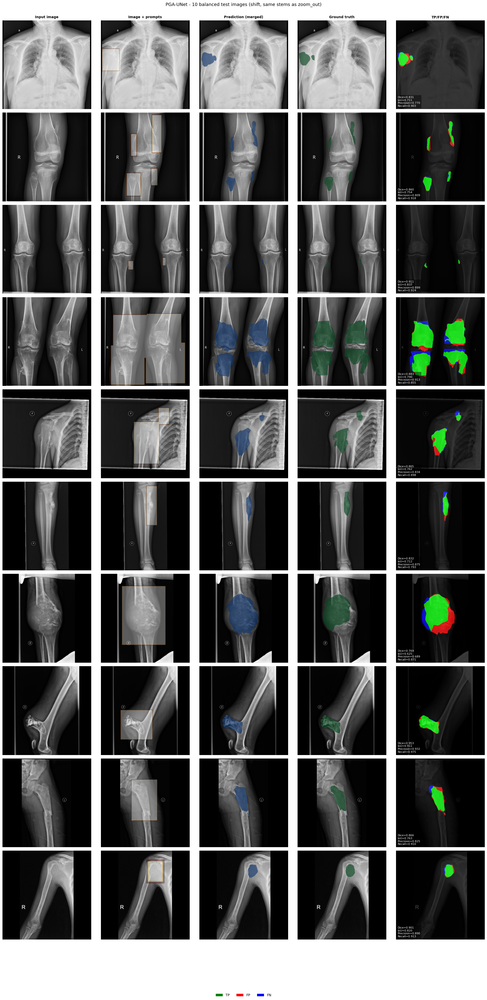

In [4]:
# Use the same balanced test stems for the shift-mode PGA panel.
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
from IPython.display import display as _ipy_display

assert 'all_image_records' in dir(), '❌ Run the PGA test cell first'
assert 'BALANCED_TEST_STEMS_R512' in dir(), '❌ Run the zoom_out PGA visualization cell first'
recs=[r for r in all_image_records['shift'] if r['img_name'] in BALANCED_TEST_STEMS_R512]
recs=sorted(recs,key=lambda r: BALANCED_TEST_STEMS_R512.index(r['img_name']))
N_SHOW=len(recs)
fig,axes=plt.subplots(N_SHOW,5,figsize=(20,4*N_SHOW))
if N_SHOW==1: axes=axes[np.newaxis,:]
fig.suptitle(f'PGA-UNet - {N_SHOW} balanced test images (shift, same stems as zoom_out)',fontsize=13,y=1.001)
for ax,ct in zip(axes[0],['Input image','Image + prompts','Prediction (merged)','Ground truth','TP/FP/FN']): ax.set_title(ct,fontsize=10,fontweight='bold')
for count,rec in enumerate(recs):
    img_np=rec['img']*0.5+0.5; gt_np=(rec['gt']>0.5).astype(float); pred_np=(rec['prob']>0.5).astype(float)
    pm_merged=np.max(np.stack(rec['prompts'],axis=0),axis=0)
    tp=(pred_np*gt_np).sum(); fp=(pred_np*(1-gt_np)).sum(); fn=((1-pred_np)*gt_np).sum(); e=1e-6
    dice=float((2*tp+e)/(2*tp+fp+fn+e)); iou=float((tp+e)/(tp+fp+fn+e)); pre=float((tp+e)/(tp+fp+e)); rec_=float((tp+e)/(tp+fn+e))
    row=axes[count]; bg=np.stack([img_np]*3,axis=-1)
    row[0].imshow(img_np,cmap='gray',vmin=0,vmax=1); row[0].set_ylabel(f'#{count+1} [{rec["n_samples"]}p]\nDice={dice:.3f}',fontsize=8)
    row[1].imshow(img_np,cmap='gray',vmin=0,vmax=1); row[1].imshow(np.where(pm_merged>0,pm_merged,np.nan),cmap='hot',alpha=0.35,vmin=0,vmax=1)
    row[2].imshow(bg); row[2].imshow(np.where(pred_np>0,pred_np,np.nan),cmap='Blues',alpha=0.60,vmin=0,vmax=1)
    row[3].imshow(bg); row[3].imshow(np.where(gt_np>0,gt_np,np.nan),cmap='Greens',alpha=0.60,vmin=0,vmax=1)
    ov=np.zeros((*gt_np.shape,3),dtype=float); ov[...,1]=pred_np*gt_np; ov[...,0]=pred_np*(1-gt_np); ov[...,2]=(1-pred_np)*gt_np
    row[4].imshow(bg); row[4].imshow(ov,alpha=0.75,vmin=0,vmax=1)
    row[4].text(0.02,0.02,f'Dice={dice:.3f}\nIoU={iou:.3f}\nPrecision={pre:.3f}\nRecall={rec_:.3f}',transform=row[4].transAxes,fontsize=8,va='bottom',ha='left',bbox=dict(facecolor='black',alpha=0.45,pad=3,edgecolor='none'),color='white')
    for ax in row: ax.axis('off')
handles=[Patch(facecolor='green',label='TP'),Patch(facecolor='red',label='FP'),Patch(facecolor='blue',label='FN')]
fig.legend(handles=handles,loc='lower center',ncol=3,frameon=False)
plt.tight_layout(); plt.subplots_adjust(bottom=0.06); plt.show()


---
## Part 2 - Attention U-Net (IMG_SIZE=512, no prompt)
---

✅ Attention U-Net loaded  [cuda]  10053 KB
Visualization: 25 images matched to PGA (>=2 GT polygons)


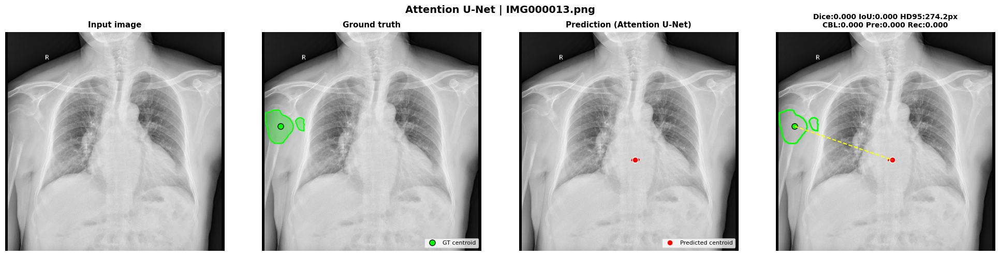

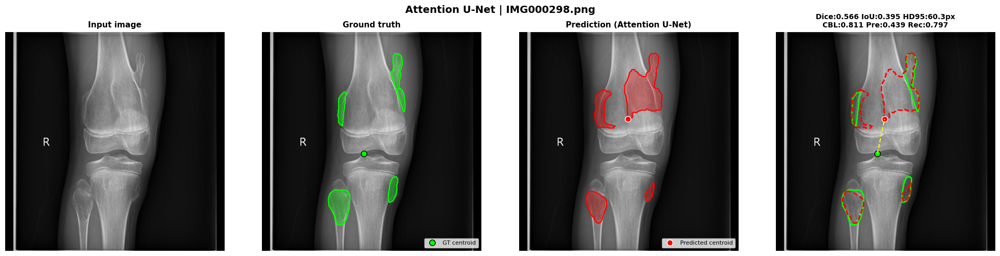

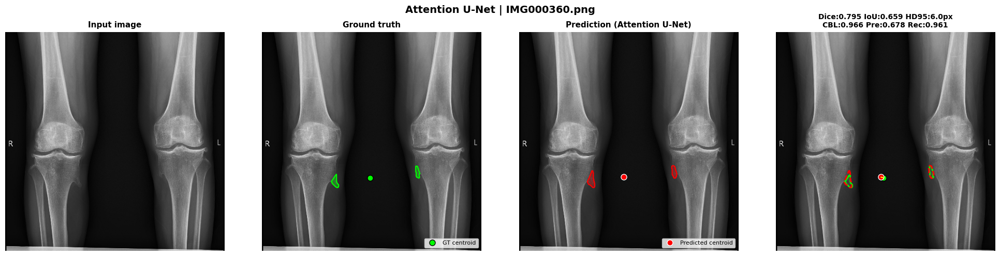

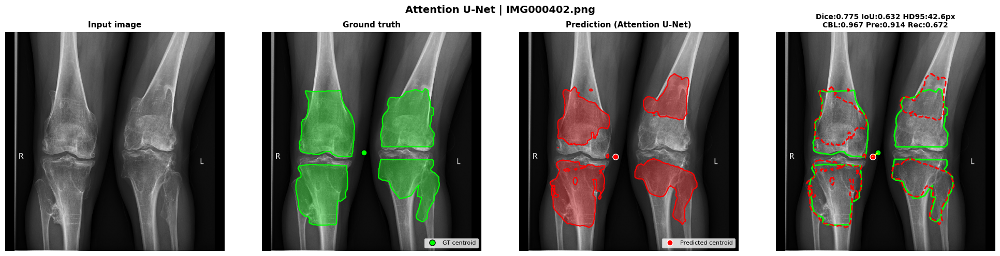

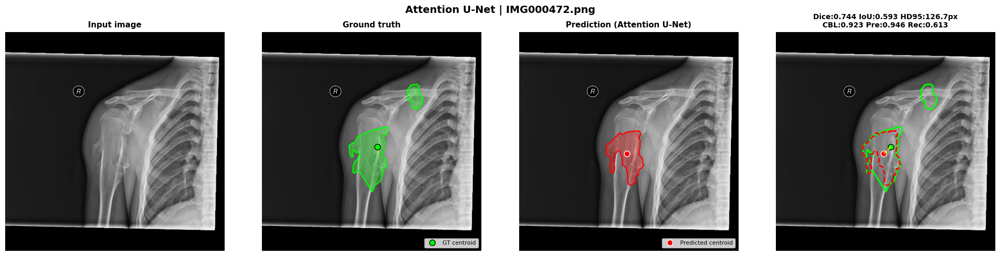

...

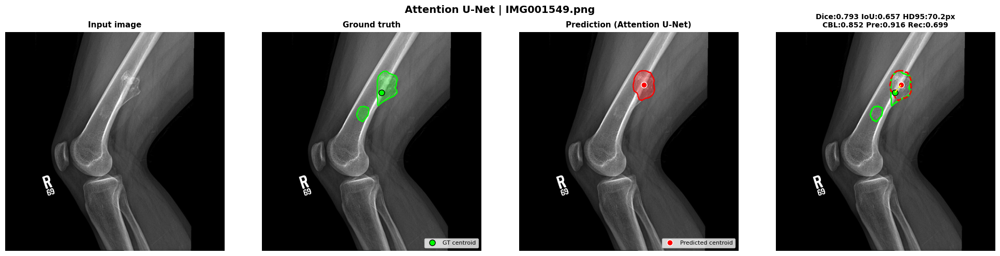

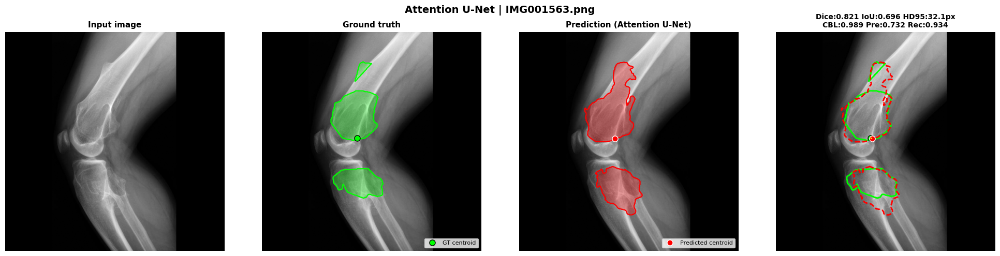

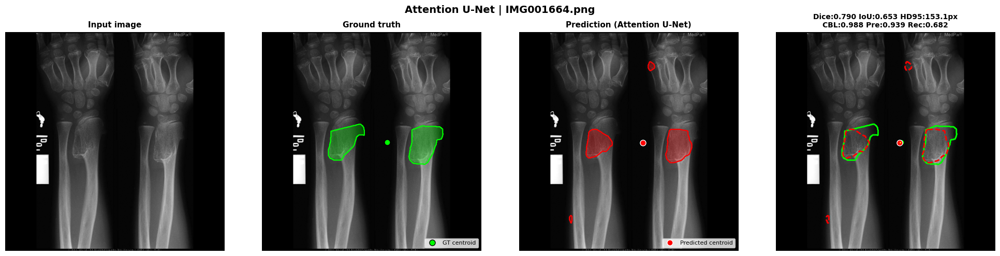

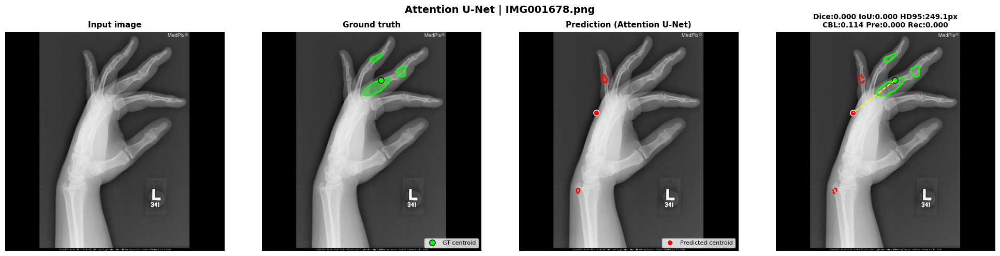

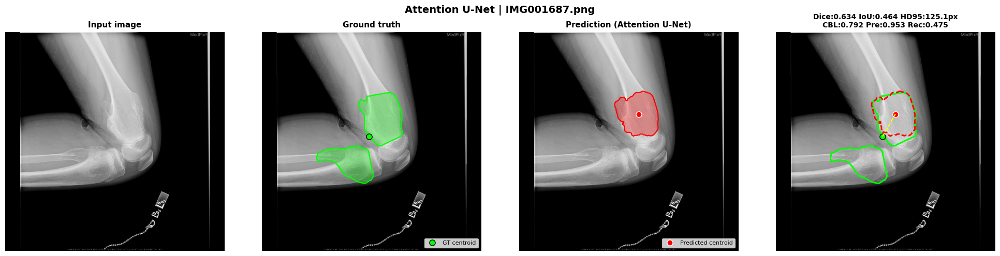

/tmp/ipykernel_23/246836565.py:142: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[2].legend(loc='lower right',fontsize=8); axes[2].set_title('Prediction (Attention U-Net)',fontsize=11,fontweight='bold')


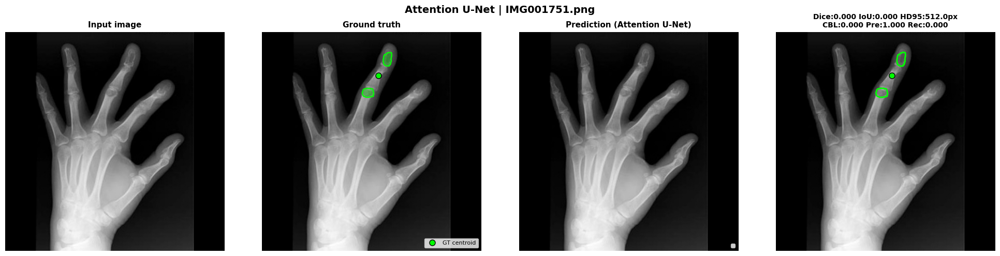

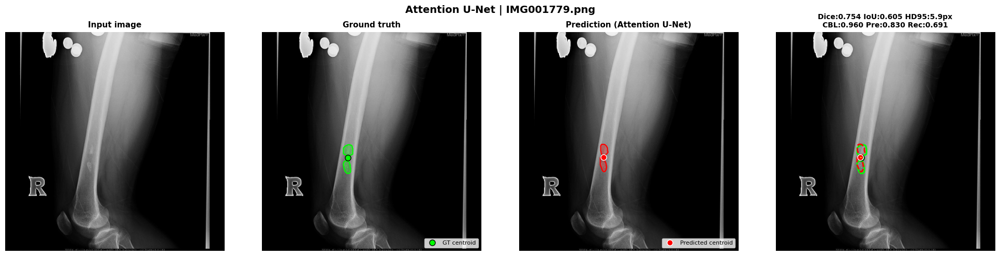

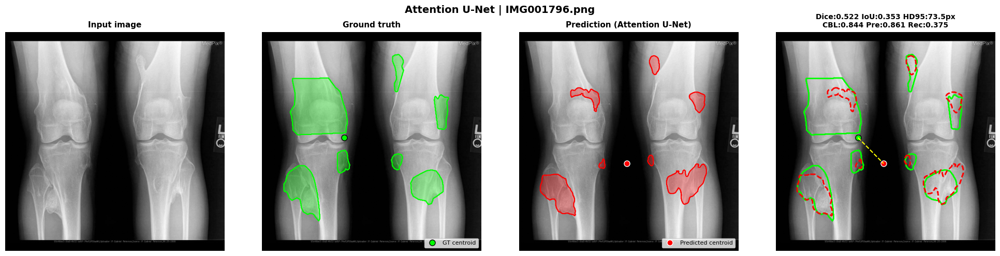

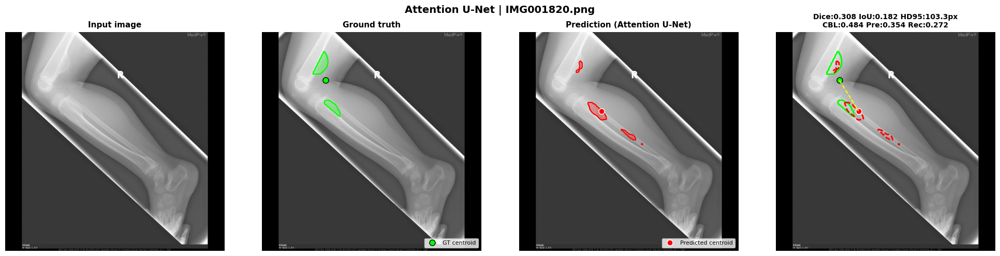


FINAL TEST RESULTS - U-NET 2D | ImgSize=512
  dice        : 0.5160
  iou         : 0.4137
  precision   : 0.6220
  recall      : 0.5670
  hd95        : 129.6733
  cbl         : 0.5995
  Total       : 187 samples
✅ CSV saved


In [5]:
# ══════════════════════════════════════════════════════
# PART 2 - Attention U-Net Test (IMG_SIZE=512)
# ══════════════════════════════════════════════════════
import os, csv, sys
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from scipy.ndimage import binary_erosion, distance_transform_edt

BASE      = '/kaggle/working' if os.path.exists('/kaggle/working') else '/content'
UNET_ROOT = f'{BASE}/PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation'

# ── Clear the module cache, then load Attention U-Net modules ─────────────────────────
for _k in list(sys.modules.keys()):
    if any(x in _k for x in ('dataset','models','attention_unet','unet')): del sys.modules[_k]
if UNET_ROOT not in sys.path: sys.path.insert(0, UNET_ROOT)
else: sys.path.remove(UNET_ROOT); sys.path.insert(0, UNET_ROOT)

from models.networks.attention_unet_2D import Attention_UNet_2D

DEVICE     = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
class ImageMaskDataset(torch.utils.data.Dataset):
    def __init__(self, image_dir, mask_dir, img_size=512, is_train=False):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.img_size = img_size
        self.is_train = is_train
        self.images = sorted([f for f in os.listdir(image_dir) if f.lower().endswith((".png", ".jpg", ".jpeg"))])
        self.masks = sorted([f for f in os.listdir(mask_dir) if f.lower().endswith(".png")])

    def __len__(self):
        return min(len(self.images), len(self.masks))

    def _resize_and_pad(self, array, interpolation, pad_value=0):
        h, w = array.shape[:2]
        scale = min(self.img_size / w, self.img_size / h)
        new_w = max(1, int(round(w * scale)))
        new_h = max(1, int(round(h * scale)))
        resized = cv2.resize(array, (new_w, new_h), interpolation=interpolation)
        padded = np.full((self.img_size, self.img_size), pad_value, dtype=resized.dtype)
        pad_left = (self.img_size - new_w) // 2
        pad_top = (self.img_size - new_h) // 2
        padded[pad_top:pad_top + new_h, pad_left:pad_left + new_w] = resized
        return padded

    def __getitem__(self, idx):
        image = cv2.imread(os.path.join(self.image_dir, self.images[idx]), cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(os.path.join(self.mask_dir, self.masks[idx]), cv2.IMREAD_GRAYSCALE)
        image = self._resize_and_pad(image, cv2.INTER_LINEAR, pad_value=0)
        mask = self._resize_and_pad(mask, cv2.INTER_NEAREST, pad_value=0)
        image = (image.astype(np.float32) / 255.0 - 0.5) / 0.5
        mask = (mask > 127).astype(np.float32)
        image = torch.from_numpy(image).unsqueeze(0)
        mask = torch.from_numpy(mask).unsqueeze(0)
        return image, mask

MODEL_PATH = f'{UNET_ROOT}/checkpoints/att_unet_best.pth'
IMG_SIZE   = 512

def calc_hd95_u(pred, gt):
    pred, gt = pred.astype(bool), gt.astype(bool)
    if not pred.any() and not gt.any(): return 0.0
    if not pred.any() or  not gt.any(): return float(IMG_SIZE)
    pe=pred^binary_erosion(pred); ge=gt^binary_erosion(gt)
    d1=distance_transform_edt(~ge)[pe]; d2=distance_transform_edt(~pe)[ge]
    if not len(d1) or not len(d2): return float(IMG_SIZE)
    return float(max(np.percentile(d1,95),np.percentile(d2,95)))

def calc_cbl_u(pred_bin, gt_bin):
    if gt_bin.sum()==0: return None
    ys,xs=np.where(gt_bin)
    gt_diag=np.sqrt((ys.max()-ys.min())**2+(xs.max()-xs.min())**2)+1e-6
    if pred_bin.sum()==0: return 0.0
    yp,xp=np.where(pred_bin)
    return float(np.clip(1.0-np.sqrt((xp.mean()-xs.mean())**2+(yp.mean()-ys.mean())**2)/gt_diag,0.0,1.0))

def get_centroid(m):
    if m.sum()==0: return None,None
    ys,xs=np.where(m); return float(xs.mean()),float(ys.mean())

model=Attention_UNet_2D(in_channels=1,n_classes=1).to(DEVICE)
model.load_state_dict(torch.load(MODEL_PATH,map_location=DEVICE,weights_only=True))
model.eval()
print(f'✅ Attention U-Net loaded  [{DEVICE}]  {os.path.getsize(MODEL_PATH)//1024} KB')

test_dataset=ImageMaskDataset(image_dir=f'{UNET_ROOT}/dataset_BTXRD/test/images',
                            mask_dir =f'{UNET_ROOT}/dataset_BTXRD/test/masks',
                            img_size=IMG_SIZE, is_train=False)
test_dataset.images = sorted(test_dataset.images)
if hasattr(test_dataset, 'masks'):
    test_dataset.masks = sorted(test_dataset.masks)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Image names in sorted order, matched to the DataLoader
img_names_sorted = [os.path.basename(p) for p in test_dataset.images]

# Select visualization images: match PGA images (>=2 GT polygons) when available; otherwise use the first 10 images
if 'all_image_records' in dir() and 'zoom_out' in all_image_records:
    _pga_names = {r['img_name'] for r in all_image_records['zoom_out'] if r['n_samples'] >= 2}
    SHOW_INDEX  = {i for i, n in enumerate(img_names_sorted) if n in _pga_names}
    print(f'Visualization: {len(SHOW_INDEX)} images matched to PGA (>=2 GT polygons)')
else:
    SHOW_INDEX = set(range(10))
    print(f'Visualization: the first 10 images (all_image_records not found in memory)')

unet_all_dice,unet_all_iou,unet_all_pre,unet_all_rec,unet_all_hd95,unet_all_cbl=[],[],[],[],[],[]
smooth=1e-5

with torch.no_grad():
    for idx,(images,masks) in enumerate(test_loader):
        images,masks=images.to(DEVICE),masks.to(DEVICE)
        preds=(torch.sigmoid(model(images))>0.5).float()
        img_np=(images[0,0].cpu().numpy()+1)/2.0
        gm=masks[0,0].cpu().numpy(); pm=preds[0,0].cpu().numpy()
        tp=(pm*gm).sum(); fp=(pm*(1-gm)).sum(); fn=((1-pm)*gm).sum()
        dice=(2*tp+smooth)/(2*tp+fp+fn+smooth); iou=(tp+smooth)/(tp+fp+fn+smooth)
        pre=(tp+smooth)/(tp+fp+smooth);          rec=(tp+smooth)/(tp+fn+smooth)
        hd=calc_hd95_u(pm.astype(bool),gm.astype(bool))
        cbl=calc_cbl_u(pm.astype(bool),gm.astype(bool))
        unet_all_dice.append(dice); unet_all_iou.append(iou)
        unet_all_pre.append(pre);   unet_all_rec.append(rec)
        unet_all_hd95.append(hd)
        if cbl is not None: unet_all_cbl.append(cbl)

        if idx in SHOW_INDEX:
            img_name = img_names_sorted[idx]
            cx_gt,cy_gt=get_centroid(gm); cx_p,cy_p=get_centroid(pm)
            fig,axes=plt.subplots(1,4,figsize=(20,5))
            fig.suptitle(f'Attention U-Net | {img_name}',fontsize=14,fontweight='bold')
            axes[0].imshow(img_np,cmap='gray'); axes[0].set_title('Input image',fontsize=11,fontweight='bold')
            axes[1].imshow(img_np,cmap='gray')
            green=np.zeros((*gm.shape,4),dtype=np.float32); green[gm==1]=[0,1,0,0.3]; axes[1].imshow(green)
            if gm.max()>0: axes[1].contour(gm,[0.5],colors='lime',linewidths=1.5)
            if cx_gt is not None: axes[1].plot(cx_gt,cy_gt,'o',color='lime',ms=8,markeredgecolor='black',label='GT centroid')
            axes[1].legend(loc='lower right',fontsize=8); axes[1].set_title('Ground truth',fontsize=11,fontweight='bold')
            axes[2].imshow(img_np,cmap='gray')
            red=np.zeros((*pm.shape,4),dtype=np.float32); red[pm==1]=[1,0,0,0.3]; axes[2].imshow(red)
            if pm.max()>0: axes[2].contour(pm,[0.5],colors='red',linewidths=1.5)
            if cx_p is not None: axes[2].plot(cx_p,cy_p,'o',color='red',ms=8,markeredgecolor='white',label='Predicted centroid')
            axes[2].legend(loc='lower right',fontsize=8); axes[2].set_title('Prediction (Attention U-Net)',fontsize=11,fontweight='bold')
            axes[3].imshow(img_np,cmap='gray')
            if gm.max()>0: axes[3].contour(gm,[0.5],colors='lime',linewidths=2)
            if pm.max()>0: axes[3].contour(pm,[0.5],colors='red', linewidths=2,linestyles='--')
            if cx_gt is not None: axes[3].plot(cx_gt,cy_gt,'o',color='lime',ms=8,markeredgecolor='black')
            if cx_p  is not None: axes[3].plot(cx_p, cy_p, 'o',color='red', ms=8,markeredgecolor='white')
            if cx_gt is not None and cx_p is not None:
                axes[3].plot([cx_gt,cx_p],[cy_gt,cy_p],'--',color='yellow',lw=1.5)
            axes[3].set_title(f'Dice:{dice:.3f} IoU:{iou:.3f} HD95:{hd:.1f}px\nCBL:{cbl:.3f} Pre:{pre:.3f} Rec:{rec:.3f}',
                              fontsize=10,fontweight='bold')
            for ax in axes: ax.axis('off')
            plt.tight_layout(); plt.show()

# ── Final report ──────────────────────────────────────────────────────
att_unet_results = dict(dice=float(np.mean(unet_all_dice)),  iou=float(np.mean(unet_all_iou)),
                    precision=float(np.mean(unet_all_pre)), recall=float(np.mean(unet_all_rec)),
                    hd95=float(np.mean(unet_all_hd95)),  cbl=float(np.mean(unet_all_cbl)))
print('\n'+'='*60)
print('FINAL TEST RESULTS - U-NET 2D | ImgSize=512')
print('='*60)
for k,v in att_unet_results.items(): print(f'  {k:<12}: {v:.4f}')
print(f'  Total       : {len(unet_all_dice)} samples')
print('='*60)

os.makedirs(f'{UNET_ROOT}/results', exist_ok=True)
with open(f'{UNET_ROOT}/results/attention_att_unet_results.csv','w',newline='') as f:
    w=csv.writer(f)
    w.writerow(['model','dice','iou','precision','recall','hd95','cbl','n_samples'])
    w.writerow(['AttentionAttentionUNet']+[f'{att_unet_results[k]:.4f}' for k in ['dice','iou','precision','recall','hd95','cbl']]+[len(unet_all_dice)])
print(f'✅ CSV saved')


---
## Summary & Comparison
---

Using in-memory `pga_results`
Using in-memory `att_unet_results`

════════════════════════════════════════════════════════════════════════════════
  COMPARISON - PGA-UNet (zoom_out) vs Attention U-Net (image-level, IMG_SIZE=512)
════════════════════════════════════════════════════════════════════════════════
  Model                           Dice↑     IoU↑    Prec↑     Rec↑HD95↓ (px)     CBL↑
  -----------------------------------------------------------------------------
  PGA-UNet (zoom_out)            0.8788   0.7895   0.8588   0.9082   9.0829   0.9619
  Attention U-Net                0.5160   0.4137   0.6220   0.5670 129.6733   0.5995
════════════════════════════════════════════════════════════════════════════════
  Delta PGA - AttentionUNet  [DICE      ]: +0.3629
  Delta PGA - AttentionUNet  [IOU       ]: +0.3757
  Delta PGA - AttentionUNet  [PRECISION ]: +0.2368
  Delta PGA - AttentionUNet  [RECALL    ]: +0.3411
  Delta PGA - AttentionUNet  [HD95      ]: -120.5904  (negative means

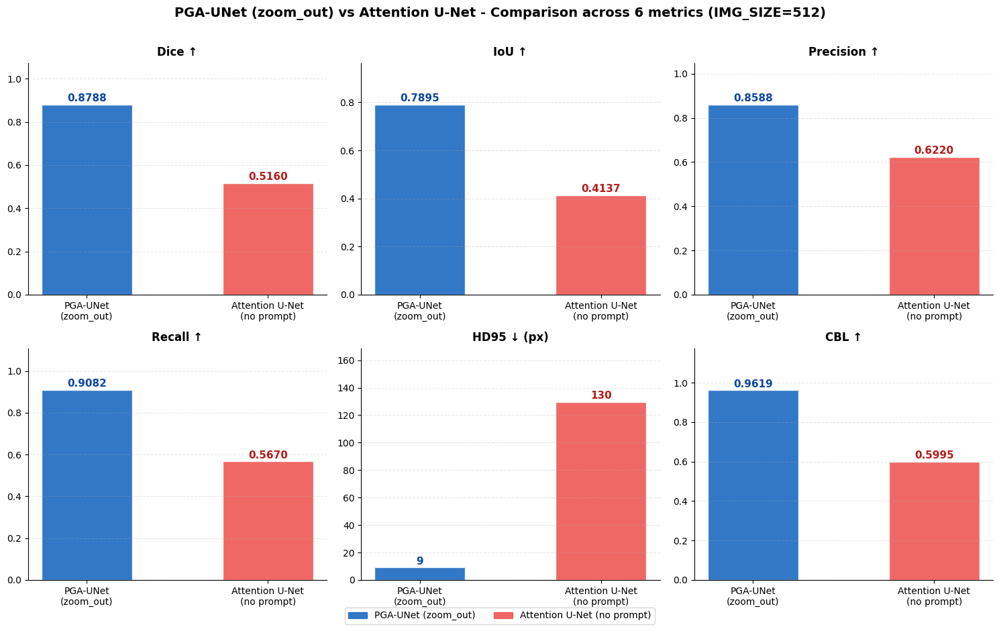


✅ Figure saved: pga_vs_attention_unet_comparison.png


In [6]:
# ══════════════════════════════════════════════════════
# SUMMARY - PGA-UNet (zoom_out) vs Attention U-Net (IMG_SIZE=512)
# Load from CSV if the variables are not already in memory
# ══════════════════════════════════════════════════════
import csv, os, numpy as np
import matplotlib.pyplot as plt

BASE      = '/kaggle/working' if os.path.exists('/kaggle/working') else '/content'
PGA_ROOT  = f'{BASE}/PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation'
UNET_ROOT = f'{BASE}/PGA_Unet2D'
KEYS      = ['dice','iou','precision','recall','hd95','cbl']

# ── Load results: prioritize in-memory variables, otherwise fall back to CSV ──────────────
if 'pga_results' not in dir() or not pga_results:
    with open(f'{PGA_ROOT}/results/pga_unet2d_test_results.csv') as _f:
        pga_results = {}
        for _row in csv.DictReader(_f):
            pga_results[_row['mode']] = {k: float(_row[k]) for k in KEYS}
    print('Loaded `pga_results` from CSV')
else:
    print('Using in-memory `pga_results`')

if 'att_unet_results' not in dir() or not att_unet_results:
    with open(f'{UNET_ROOT}/results/attention_att_unet_results.csv') as _f:
        _row = next(csv.DictReader(_f))
        att_unet_results = {k: float(_row[k]) for k in KEYS}
    print('Loaded `att_unet_results` from CSV')
else:
    print('Using in-memory `att_unet_results`')

HDRS   = ['Dice↑','IoU↑','Prec↑','Rec↑','HD95↓ (px)','CBL↑']
pga_zo = pga_results['zoom_out']

# ── Summary table ────────────────────────────────────────────────────
bar='═'*80
print(f'\n{bar}')
print('  COMPARISON - PGA-UNet (zoom_out) vs Attention U-Net (image-level, IMG_SIZE=512)')
print(f'{bar}')
print(f"  {'Model':<28}"+''.join(f'{h:>9}' for h in HDRS))
print('  '+'-'*77)
print(f"  {'PGA-UNet (zoom_out)':<28}"+''.join(f'{pga_zo[k]:>9.4f}'      for k in KEYS))
print(f"  {'Attention U-Net':<28}"          +''.join(f'{att_unet_results[k]:>9.4f}' for k in KEYS))
print(f'{bar}')
for k in KEYS:
    delta = pga_zo[k] - att_unet_results[k]
    suffix = '  (negative means PGA is better)' if k == 'hd95' else ''
    print(f'  Delta PGA - AttentionUNet  [{k.upper():<10}]: {delta:+.4f}{suffix}')

# ── Bar charts ──────────────────────────────────────────────────────
METRIC_PAIRS = [
    ('dice',      'Dice ↑'),
    ('iou',       'IoU ↑'),
    ('precision', 'Precision ↑'),
    ('recall',    'Recall ↑'),
    ('hd95',      'HD95 ↓ (px)'),
    ('cbl',       'CBL ↑'),
]

fig, axes = plt.subplots(2, 3, figsize=(15, 9))
axes = axes.flatten()
fig.suptitle('PGA-UNet (zoom_out) vs Attention U-Net - Comparison across 6 metrics (IMG_SIZE=512)',
             fontsize=14, fontweight='bold', y=1.01)

COLOR_PGA  = '#1565C0'
COLOR_ATT = '#EF5350'
x_pos      = [0, 1]
x_labels   = ['PGA-UNet\n(zoom_out)', 'Attention U-Net\n(no prompt)']

for ax_idx, (metric, label) in enumerate(METRIC_PAIRS):
    ax   = axes[ax_idx]
    vals = [pga_zo[metric], att_unet_results[metric]]
    clrs = [COLOR_PGA, COLOR_ATT]

    ax.bar(x_pos, vals, 0.5, color=clrs, alpha=0.88, edgecolor='white')
    for xi, val, tc in zip(x_pos, vals, ['#0D47A1','#B71C1C']):
        fmt = f'{val:.0f}' if metric == 'hd95' else f'{val:.4f}'
        ax.text(xi, val + (0.006 if metric != 'hd95' else 0.8), fmt,
                ha='center', va='bottom', fontsize=11, fontweight='bold', color=tc)

    ax.set_title(label, fontsize=12, fontweight='bold', pad=8)
    hi = max(vals)
    ax.set_ylim(0, hi * 1.22 if metric != 'hd95' else hi * 1.30)
    ax.set_xticks(x_pos); ax.set_xticklabels(x_labels, fontsize=10)
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)

handles = [plt.Rectangle((0,0),1,1,color=COLOR_PGA, alpha=0.88),
           plt.Rectangle((0,0),1,1,color=COLOR_ATT, alpha=0.88)]
fig.legend(handles, ['PGA-UNet (zoom_out)', 'Attention U-Net (no prompt)'],
           loc='lower center', ncol=2, fontsize=10, bbox_to_anchor=(0.5,-0.02))

plt.tight_layout()
plt.savefig(f'{BASE}/pga_vs_attention_unet_comparison.png', dpi=150, bbox_inches='tight')
from IPython.display import display as _d; _d(fig); plt.close(fig)
print('\n✅ Figure saved: pga_vs_attention_unet_comparison.png')
